# Автоматично оцветяване на черно-бели снимки

Един пример за резултатът от изпълнението. Вляво е оригиналната снимка, вдясно е оцветената от модела.

<img src="img/result.png" width="700px" height="300px">

Първия проблем при оцветяването на изображения е каква да бъде основната единица за оцветяване. С други думи дали да се оцветява пиксел по пиксел или някаква по голяма група от пиксели. Тъй като оцветяването на всеки отделен пиксел изисква значително по-голям ресурс от алтернативата аз избрах да разделя изображението на "суперпиксели" и да опитвам да предскажа цвят за целия суперпиксел.

За целта използвам алгоритъмът SLIC. Нека видим какво ни дава той.

In [5]:
import matplotlib.pyplot as plt
import numpy as np
from skimage.segmentation import slic
from skimage.util import img_as_float
from PIL import Image

%matplotlib inline

In [4]:
def segment_image(image, number_of_segments):
    return slic(image, n_segments=number_of_segments, compactness=10, sigma=1)

In [6]:
def read_img(path):
    return Image.open(path)

In [8]:
img = read_img("data/landscapes/test/39373580184.jpg")
segments = segment_image(img, 500)

In [9]:
from skimage.segmentation import mark_boundaries

img_segmented = mark_boundaries(img, segments)

Text(0.5,1,'Segmented')

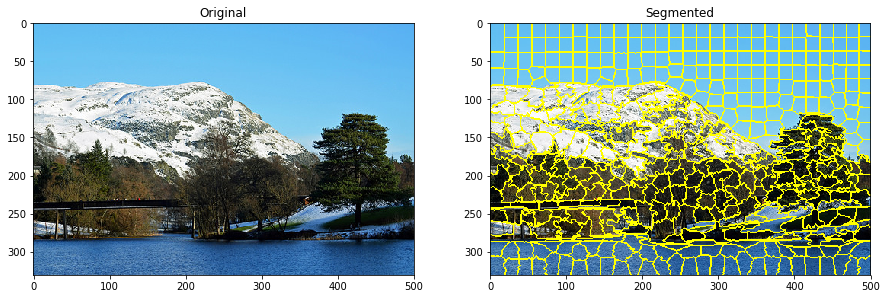

In [23]:
f, ax = plt.subplots(1, 2, figsize=(15,15))
ax[0].imshow(img)
ax[0].set_title("Original")
ax[1].imshow(img_segmented)
ax[1].set_title("Segmented")

По този начин изглеждат сегментите генерирани от алгоритъма SLIC. Грубо те групират пиксели с подобна осветеност. В случая са генерирани около 500 сегмента.

За целите на проекта е по удобно картинките да не са в RGB цветовото пространство. Вместо това използвам YUV, ключовото при него е, че Y частта кодира осветеността на пиксела, докато U и V кодират цветовете. С други думи ако вземем само Y частта на изображението все едно сме го направили черно-бяло. 

След бърза справка с [уикипедия](https://en.wikipedia.org/wiki/YUV#Y%E2%80%B2UV444_to_RGB888_conversion) става ясно че преминаването от едното цветово пространсто в другото става доста лесно, чрез едно умножение на матрици. 

In [24]:
YUV_TO_RGB = np.array([[1, 0, 1.13983],
                       [1, -0.39465, -.58060],
                       [1, 2.03211, 0]]).T

RGB_TO_YUV = np.array([[0.299, 0.587, 0.114],
                       [-0.14713, -0.28886, 0.436],
                       [0.615, -0.51499, -0.10001]]).T

Дефинирам и описаната в статията clamp функция. Идеята е тя да намества стойности които са излезли извън интервала 0-255 или 0-1 както ще бъде в случая.

In [25]:
def clamp(value, lower_bound, upper_bound):
    upper_clamp = np.minimum(value, upper_bound)
    return np.maximum(upper_clamp, lower_bound)

In [26]:
def yuv_to_rgb(img):
    return clamp(np.dot(img, YUV_TO_RGB), 0, 1)

def rgb_to_yuv(img):
    return np.dot(img, RGB_TO_YUV)

Вижда се от матрицата за преобразуване в YUV, че максималната стойност на U е 0.436, а минималната е -0.436. Аналогично максималната и минималната стойност за V са 0.615 и -0.615. Дефинирам помощни clamp функции.

In [27]:
U_MAX = 0.436
U_MIN = -U_MAX
V_MAX = 0.615
V_MIN = -V_MAX

def clamp_u(val):
    return clamp(val, U_MIN, U_MAX)

def clamp_v(val):
    return clamp(val, V_MIN, V_MAX)

Резултатът от SLIC е масив с големина колкото е големината на картинката. Всеки елемент от масива е число от 0 до броя сегменти и указва дадения пиксел към кой сегмент принадлежи. Това трябва да се превърне в списък от списъци, където всеки списък съдържа координатите на всички пиксели от дадения сегмент.

In [30]:
def get_pixels_for_segment(segments):
    """gets coordinates of pixels per segment"""
    pixels_for_segment = [[] for _ in range(segments.max() + 1)]
    for (x, y), segment_label in np.ndenumerate(segments):
        pixels_for_segment[segment_label].append((x, y))
    return np.array([np.array(segment) for segment in pixels_for_segment])

Друг проблем е, че SLIC генерира сегменти с разнообразна площ, тоест няма как да взема всички пиксели от сегмент като feature вектор. Един вариант е да взема пикселите в дадена област (квадратна или кръгла с фиксирана страна или радиус) около центроида на сегмента, но това не работи добре ако сегментите са много тънки. Така ще взимам много пиксели които не принадлежат на сегмента. Вместо това реших да семплирам равномерно сегмента с фиксиран размер на извадката. В този случай пикселите не задължително ще се намират един до друг, но тъй като са равномерно семплирани от целия сегмент би трябвало осветеността им да е показателна за сегмента. 

In [31]:
def sample_segment_with(pixels_for_segment, sample_size):
    """sample 'sample_size' points randomly from every segment"""
    segments_sampled = [[] for _ in range(len(pixels_for_segment))]
    for segment_index, segment in enumerate(pixels_for_segment):
        segments_sampled[segment_index] = segment[np.random.choice(len(segment), sample_size)]
    return np.array(segments_sampled)

Функция която извлича от изображение в YUV и семплирани сегменти - за всеки сегмент осветеността на семплираните пиксели и средната стойност за U и V.

In [32]:
def get_lum_chrom_triple_sample(yuv_image, sampled_segments):
    """get a luminance vector for every segment and a vector with average chrominance per channel per segment"""

    luminance = np.zeros((sampled_segments.shape[0], sampled_segments.shape[1]))
    u = np.zeros(sampled_segments.shape[0])
    v = np.zeros(sampled_segments.shape[0])
    for index, segment in enumerate(sampled_segments):
        for index_in_segment, (x, y) in enumerate(segment):
            luminance[index][index_in_segment] = yuv_image[x, y][0]
            u[index] += yuv_image[x, y][1]
            v[index] += yuv_image[x, y][2]
        luminance[index] = np.fft.fft(luminance[index])
    return luminance, u / sampled_segments.shape[1], v / sampled_segments.shape[1]

Осветеността минава през FFT. Четох, че е полезно при сравняване на изображения и наистина така дава по-добри резултати. 

In [33]:
def get_lum_chrom_triple_image(path, number_of_segments, sample_size):
    img = read_img(path)
    segments = segment_image(img, number_of_segments)
    pixels_per_segment = get_pixels_for_segment(segments)
    sampled_segments = sample_segment_with(pixels_per_segment, sample_size)
    yuv = rgb_to_yuv(img_as_float(img))
    return get_lum_chrom_triple_sample(yuv, sampled_segments)

След като сме предсказали стойности за цветовете на сегментите, трябва да оцветим самите сегменти.

In [34]:
def color_picture(yuv_img_float, u_predicted, v_predicted, pixels_per_segment):
    img = np.copy(yuv_img_float)
    for segment_index, segment in enumerate(pixels_per_segment):
        u = u_predicted[segment_index]
        v = v_predicted[segment_index]
        for x, y in segment:
            img[x, y][1] = u
            img[x, y][2] = v
    return yuv_to_rgb(img)

In [51]:
def generate_all_feature_vectors(path, number_of_segments, sample_size):
    """path is the path to the directory containing train images"""
    u_all = np.array([])
    v_all = np.array([])
    lum_all = np.array([]).reshape((0, sample_size))
    i = 1
    for root, dirs, files in os.walk(path):
        for filename in files:
            if filename.endswith(".jpg"):
                print("\rWorking on picture {0} of {1}".format(i, len(files)), end="")
                lum, u, v = get_lum_chrom_triple_image(path + "/" + filename, number_of_segments, 
                                               sample_size)
                i += 1
                u_all = np.concatenate((u_all, u))
                v_all = np.concatenate((v_all, v))
                lum_all = np.vstack((lum_all, lum))
    print()
    return lum_all, u_all, v_all

Изтеглих около 150 снимки на пейзажи, които ще използвам за трениране на модела.

Първия модел, който ще тренирам е SVR.

In [49]:
from sklearn.svm import SVR
import os
from sklearn.externals import joblib

def train_svr(path, number_of_segments, sample_size, retrain=False):
    if retrain:
        lum_all, u_all, v_all = generate_all_feature_vectors(path, number_of_segments, sample_size)
        u_svr = SVR()
        v_svr = SVR()
        print("Fitting model 1...")
        u_svr.fit(lum_all, u_all)
        print("Fitting model 2...")
        v_svr.fit(lum_all, v_all)
        print("Done!")
        joblib.dump(u_svr, "models/u/svr_{0}_seg_{1}_sample".format(number_of_segments, sample_size))
        joblib.dump(v_svr, "models/v/svr_{0}_seg_{1}_sample".format(number_of_segments, sample_size))
    else:
        u_svr = joblib.load("models/u/svr_{0}_seg_{1}_sample".format(number_of_segments, sample_size))
        v_svr = joblib.load("models/v/svr_{0}_seg_{1}_sample".format(number_of_segments, sample_size))

    return u_svr, v_svr

Моделите се обучават доста бавно затова след като са готови ще ги записвам.

Време е да тренираме модел!

In [50]:
u_svr, v_svr = train_svr("data/landscapes/train", 500, 300, True)

Working on picture 1 of 97

/home/thalvadzhiev/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel/__main__.py:12: ComplexWarning: Casting complex values to real discards the imaginary part


Working on picture 96 of 97Fitting model 1...
Fitting model 2...
Done!


Време е да видим как модела се справя с оцветяването.

In [54]:
def predict_image(path, u_predictor, v_predictor, number_of_segments, sample_size):
    img = read_img(path)
    segments = segment_image(img, number_of_segments)
    pixels_per_segment = get_pixels_for_segment(segments)
    sampled_segments = sample_segment_with(pixels_per_segment, sample_size)
    yuv_img = rgb_to_yuv(img_as_float(img))
    lum, u, v = get_lum_chrom_triple_sample(yuv_img, sampled_segments)
    u_predicted = clamp_u(u_predictor.predict(lum) * 3)
    v_predicted = clamp_v(v_predictor.predict(lum) * 3)
    return img, color_picture(yuv_img, u_predicted, v_predicted, pixels_per_segment)

In [55]:
img_original, img_predicted = predict_image("data/landscapes/test/39373580184.jpg", u_svr, v_svr, 500, 300)

/home/thalvadzhiev/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel/__main__.py:12: ComplexWarning: Casting complex values to real discards the imaginary part


Text(0.5,1,'Coloured')

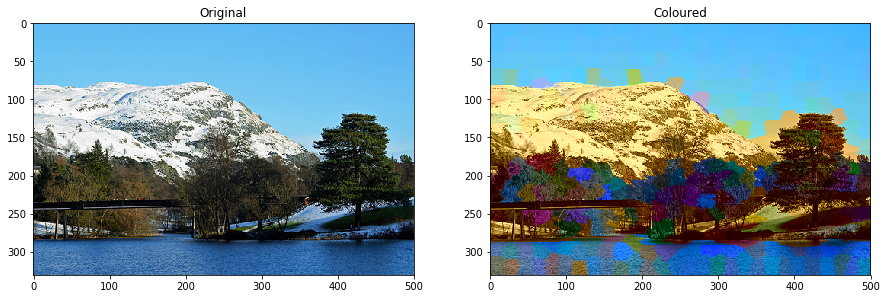

In [58]:
f, ax = plt.subplots(1, 2, figsize=(15,15))
ax[0].imshow(img_original)
ax[0].set_title("Original")
ax[1].imshow(img_predicted)
ax[1].set_title("Coloured")

Модела се е справил сравнително добре с някои части - небето е доста вярно с оригинала, водата също в по-голямата си част е добре. Най зле са дърветата - твърде шарени са. Също доста голям проблем е, че оцветяването не е плавно - изглежда на кръпки. 

За да реша този проблем прилагам една техника от image denoising - [Iterative Conditional Modes](http://www.cs.grinnell.edu/~weinman/courses/CSC213/2008F/labs/11-threads-icm.pdf). Идеята е сегментите да се представят като един Random Markov Field, на който да се приложи ICM, за да се максимизира вероятността за дадено оцветяване на всеки сегмент. Основно този модел прави две преподложения - че цветът на един сегмент зависи само от цветовете на съседните му сегменти и второ, че сам по себе си цветът на даден сегмент може да е сгрешен независимо от другите сегменти с някаква вероятност.

Ако това сработи правилно би трябвало цветовете да преливат доста по плавно.

In [59]:
def get_neighbouring_segments(segments, lum, limit):
    number_of_segments = np.max(segments) + 1
    neighbours = [set() for _ in range(number_of_segments)]
    for (x, y), value in np.ndenumerate(segments):
        if y < len(segments[x]) - 1:
            adj_value = segments[x][y + 1]
            if adj_value != value and np.linalg.norm(lum[value] - lum[adj_value]) < limit:
                neighbours[value].add(adj_value)
                neighbours[adj_value].add(value)

        if x < len(segments) - 1:
            adj_value = segments[x + 1][y]
            if adj_value != value and np.linalg.norm(lum[value] - lum[adj_value]) < limit:
                neighbours[value].add(adj_value)
                neighbours[adj_value].add(value)

    return neighbours

Една функция която да определи съседствата между сегментите (с други думи изгражда RMF). Ключово за функцията е параметъра limit. Идеята е да не считаме за съседи сегменти които имат много различна осветеност. Например в горната снимка между небето и планината има доста различна осветеност, така че не искаме цветът на едното да указва влияние върху цветът на другото въпреки че сегментите се намират непосредствено един до друг. За жалост няма универсален параметър който работи еднакво добре за всички снимки.

In [60]:
ICM_ITERATIONS = 10
COLOR_INCREMENT = 0.001
ICM_BREAK_CONDITION = 0.01
NEIGHBOUR_IMPORTANCE = 2

In [65]:
import math

def smooth_colors(predicted_u, predicted_v, segments, lum, limit):
    smoothed_u = np.copy(predicted_u)
    smoothed_v = np.copy(predicted_v)

    neighbours = get_neighbouring_segments(segments, lum, limit)
    number_of_segments = predicted_v.shape[0]
    for _ in range(ICM_ITERATIONS):
        minimized_u = np.zeros(number_of_segments)
        minimized_v = np.zeros(number_of_segments)

        for segment_idx in range(number_of_segments):
            u_energy = math.inf
            v_energy = math.inf
            u_best = None
            v_best = None

            for u in np.arange(U_MIN, U_MAX, COLOR_INCREMENT):
                cost_assumption_1 = ((u - predicted_u[segment_idx]) ** 2)
                cost_assumption_2 = NEIGHBOUR_IMPORTANCE * sum([(u - smoothed_u[neighbour]) ** 2 
                                                                for neighbour in neighbours[segment_idx]])
                u_candidate_energy = cost_assumption_1 + cost_assumption_2
                if u_candidate_energy < u_energy:
                    u_energy = u_candidate_energy
                    u_best = u
            minimized_u[segment_idx] = u_best

            for v in np.arange(V_MIN, V_MAX, COLOR_INCREMENT):
                cost_assumption_1 = ((v - predicted_v[segment_idx]) ** 2)
                cost_assumption_2 = NEIGHBOUR_IMPORTANCE * sum([(v - smoothed_v[neighbour]) ** 2 
                                                                for neighbour in neighbours[segment_idx]])
                v_candidate_energy = cost_assumption_1 + cost_assumption_2
                if v_candidate_energy < v_energy:
                    v_energy = v_candidate_energy
                    v_best = v
            minimized_v[segment_idx] = v_best

        u_delta = np.linalg.norm(smoothed_u - minimized_u)
        v_delta = np.linalg.norm(smoothed_v - minimized_v)

        smoothed_u = minimized_u
        smoothed_v = minimized_v
        if u_delta < ICM_BREAK_CONDITION and v_delta < ICM_BREAK_CONDITION:
            break

    return smoothed_u, smoothed_v

Да видим какъв е резултата след заглаждането.

In [66]:
def predict_image_smooth(path, u_predictor, v_predictor, number_of_segments, sample_size, smoothing_limit):
    img = read_img(path)
    segments = segment_image(img, number_of_segments)
    pixels_per_segment = get_pixels_for_segment(segments)
    sampled_segments = sample_segment_with(pixels_per_segment, sample_size)
    yuv_img = rgb_to_yuv(img_as_float(img))
    lum, u, v = get_lum_chrom_triple_sample(yuv_img, sampled_segments)
    u_predicted = clamp_u(u_predictor.predict(lum) * 3)
    v_predicted = clamp_v(v_predictor.predict(lum) * 3)
    u_smoothed, v_smoothed = smooth_colors(u_predicted, v_predicted, segments, lum, smoothing_limit)
    return img, color_picture(yuv_img, u_smoothed, v_smoothed, pixels_per_segment)

In [77]:
img_original, img_predicted = predict_image_smooth("data/landscapes/test/39373580184.jpg",
                                                   u_svr, v_svr, 500, 300, 50)

/home/thalvadzhiev/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel/__main__.py:12: ComplexWarning: Casting complex values to real discards the imaginary part


Text(0.5,1,'Coloured')

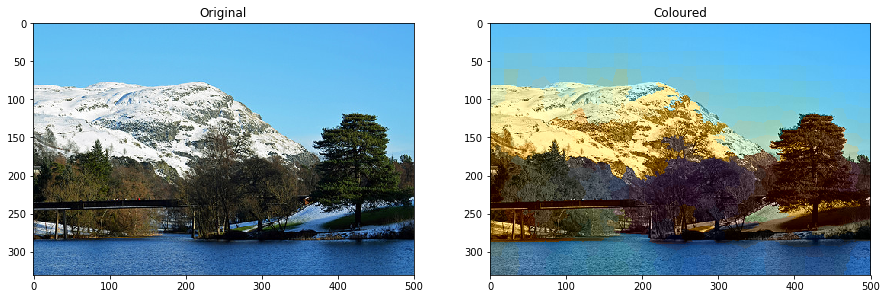

In [78]:
f, ax = plt.subplots(1, 2, figsize=(15,15))
ax[0].imshow(img_original)
ax[0].set_title("Original")
ax[1].imshow(img_predicted)
ax[1].set_title("Coloured")

Вижда се че заглаждането доста подобри резултата - водата вече изглежда равномерна, дърветата не са толкова шарени.

Нещо което може да подобри резултатите е добавяне на нов фийчър - нормализирана хистограма на осветеността. На практика това ще представлява вероятностно разпределение на осветеността в сегмента. 

In [79]:
def get_histogram_per_segment(pixels_per_segment, yuv_img, n_bins):
    """get normalized luminance histogram per segment"""
    histograms = []
    for segment in pixels_per_segment:
        lum_segment = []
        for (x, y) in segment:
            lum_segment.append(yuv_img[x, y][0])
        hist, _ = np.histogram(lum_segment, bins=n_bins, range=(0, 1))
        hist = hist / hist.sum()
        histograms.append(hist)
    return np.array(histograms)

In [80]:
def get_lum_hist_image(path, number_of_segments, sample_size, n_bins):
    img = read_img(path)
    segments = segment_image(img, number_of_segments)
    pixels_per_segment = get_pixels_for_segment(segments)
    sampled_segments = sample_segment_with(pixels_per_segment, sample_size)
    yuv = rgb_to_yuv(img_as_float(img))
    lum, u, v = get_lum_chrom_triple_sample(yuv, sampled_segments)
    hist = get_histogram_per_segment(pixels_per_segment, yuv, n_bins)
    lum_hist = np.hstack((lum, hist))
    return lum_hist, u, v

In [82]:
def generate_all_feature_vectors(path, number_of_segments, sample_size, n_bins):
    """path is the path to the directory containing train images"""
    u_all = np.array([])
    v_all = np.array([])
    lum_hist_all = np.array([]).reshape((0, sample_size + n_bins))
    i = 1
    for root, dirs, files in os.walk(path):
        for filename in files:
            if filename.endswith(".jpg"):
                print("\rWorking on picture {0} of {1}".format(i, len(files)), end="")
                lum_hist, u, v = get_lum_hist_image(path + "/" + filename, number_of_segments, 
                                               sample_size, n_bins)
                i += 1
                u_all = np.concatenate((u_all, u))
                v_all = np.concatenate((v_all, v))
                lum_hist_all = np.vstack((lum_hist_all, lum_hist))
    print()
    return lum_hist_all, u_all, v_all

In [84]:
def train_svr(path, model_name, number_of_segments, sample_size, n_bins, retrain=False):
    if retrain:
        lum_all, u_all, v_all = generate_all_feature_vectors(path, number_of_segments, sample_size, n_bins)
        u_svr = SVR()
        v_svr = SVR()
        print("Fitting model 1...")
        u_svr.fit(lum_all, u_all)
        print("Fitting model 2...")
        v_svr.fit(lum_all, v_all)
        print("Done!")
        joblib.dump(u_svr, "models/u/{0}_svr_with_hist_{1}_seg_{2}_sample".format(model_name, number_of_segments, sample_size))
        joblib.dump(v_svr, "models/v/{0}_svr_with_hist_{1}_seg_{2}_sample".format(model_name, number_of_segments, sample_size))
    else:
        u_svr = joblib.load("models/u/{0}_svr_with_hist_{1}_seg_{2}_sample".format(model_name, number_of_segments, sample_size))
        v_svr = joblib.load("models/v/{0}_svr_with_hist_{1}_seg_{2}_sample".format(model_name, number_of_segments, sample_size))

    return u_svr, v_svr

In [85]:
u_svr, v_svr = train_svr("data/landscapes/train","landscapes", 500, 300, 50, True)

Working on picture 1 of 97

/home/thalvadzhiev/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel/__main__.py:12: ComplexWarning: Casting complex values to real discards the imaginary part


Working on picture 96 of 97
Fitting model 1...
Fitting model 2...
Done!


In [86]:
def predict_image_smooth(path, u_predictor, v_predictor, number_of_segments, sample_size, smoothing_limit, n_bins):
    img = read_img(path)
    segments = segment_image(img, number_of_segments)
    pixels_per_segment = get_pixels_for_segment(segments)
    sampled_segments = sample_segment_with(pixels_per_segment, sample_size)
    yuv_img = rgb_to_yuv(img_as_float(img))
    lum, u, v = get_lum_chrom_triple_sample(yuv_img, sampled_segments)
    hist = get_histogram_per_segment(pixels_per_segment, yuv_img, n_bins)
    lum_hist = np.hstack((lum, hist))
    u_predicted = clamp_u(u_predictor.predict(lum_hist) * 3)
    v_predicted = clamp_v(v_predictor.predict(lum_hist) * 3)
    u_smoothed, v_smoothed = smooth_colors(u_predicted, v_predicted, segments, lum, smoothing_limit)
    return img, color_picture(yuv_img, u_smoothed, v_smoothed, pixels_per_segment)

In [87]:
img_original, img_predicted = predict_image_smooth("data/landscapes/test/39373580184.jpg",
                                                   u_svr, v_svr, 500, 300, 50, 50)

/home/thalvadzhiev/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel/__main__.py:12: ComplexWarning: Casting complex values to real discards the imaginary part


Text(0.5,1,'Coloured')

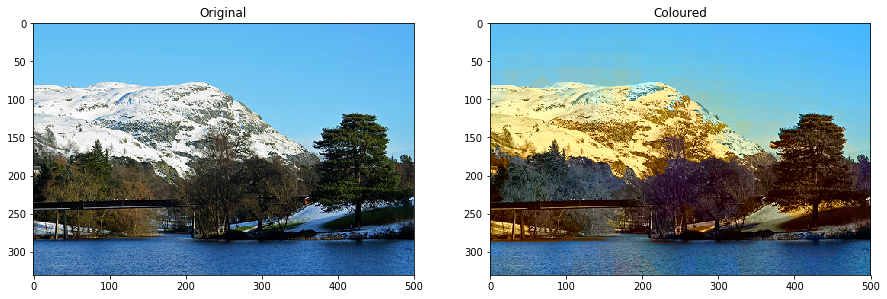

In [88]:
f, ax = plt.subplots(1, 2, figsize=(15,15))
ax[0].imshow(img_original)
ax[0].set_title("Original")
ax[1].imshow(img_predicted)
ax[1].set_title("Coloured")

Има малко подобрение, най вече в цветовете на дърветата.

Друго нещо, което мога да пробвам са SURF дескриптори. Досега самата текстура на сегментите беше игнорирана. Идеята на SURF дескрипторите е да дадат описание на характерни черти на изображението. Около центроида на всеки сегмент ще разглеждам квадрат с фиксирана дължина. В центъра на квадрата ще поставям ключова точка, на която ще се създаде SURF дескриптор. SURF дескриптора е масив от 64(или 128) числа, по принцип се ползва за сравняване на близостта на две ключови точки. Ще добавя SURF дескриптора към feature вектора.

In [90]:
import cv2
surf = cv2.xfeatures2d.SURF_create(hessianThreshold=5000, upright=True)

In [91]:
def calculate_centroid_from_segment(pixels_in_segment):
    sum_x = sum(map(lambda point: point[0], pixels_in_segment))
    sum_y = sum(map(lambda point: point[1], pixels_in_segment))
    return sum_x / len(pixels_in_segment), sum_y / len(pixels_in_segment)

In [92]:
def get_descriptor_around_centroid(img, centroid, square_side):
    #must be an rgb image
    centroid_x, centroid_y = round(centroid[0]), round(centroid[1])
    delta = square_side // 2
    top_row = int(max(centroid_y - delta, 0))
    bottom_row = int(min(centroid_y + delta, img.shape[0]))
    left_column = int(max(centroid_x - delta, 0))
    right_column = int(min(centroid_x + delta, img.shape[1]))
    img_window = img[top_row:bottom_row, left_column:right_column]
    key_point = cv2.KeyPoint(x=centroid_x, y=centroid_y, _size=2)
    _, descs = surf.compute(img_window, keypoints=[key_point], descriptors=None)
    return descs

In [93]:
def get_descriptors_from_segment(img, square_side, pixels_in_segment):
    centroid = calculate_centroid_from_segment(pixels_in_segment)
    return get_descriptor_around_centroid(img, centroid, square_side)

In [97]:
SQUARE_SIDE = 20
N_SURF_DESCRIPTORS = 64
def get_descriptors_per_segment(img, pixels_per_segment):
    descriptors = []
    for segment in pixels_per_segment:
        descs = get_descriptors_from_segment(np.array(img), SQUARE_SIDE, segment)
        if descs is not None:
            descriptors.append(descs.flatten())
        else:
            descriptors.append(np.zeros(64))
    return np.asarray(descriptors)

In [96]:
def get_lum_hist_desc_image(path, number_of_segments, sample_size, n_bins):
    img = read_img(path)
    segments = segment_image(img, number_of_segments)
    pixels_per_segment = get_pixels_for_segment(segments)
    sampled_segments = sample_segment_with(pixels_per_segment, sample_size)
    yuv = rgb_to_yuv(img_as_float(img))
    lum, u, v = get_lum_chrom_triple_sample(yuv, sampled_segments)
    hist = get_histogram_per_segment(pixels_per_segment, yuv, n_bins)
    lum_hist = np.hstack((lum, hist))
    descriptors = get_descriptors_per_segment(img, pixels_per_segment)
    lum_hist_desc = np.hstack((lum_hist, descriptors))
    return lum_hist_desc, u, v

In [98]:
def generate_all_feature_vectors(path, number_of_segments, sample_size, n_bins):
    """path is the path to the directory containing train images"""
    u_all = np.array([])
    v_all = np.array([])
    lum_hist_all = np.array([]).reshape((0, sample_size + n_bins + N_SURF_DESCRIPTORS))
    i = 1
    for root, dirs, files in os.walk(path):
        for filename in files:
            if filename.endswith(".jpg"):
                print("\rWorking on picture {0} of {1}".format(i, len(files)), end="")
                lum_hist_desc, u, v = get_lum_hist_desc_image(path + "/" + filename,
                                                               number_of_segments, sample_size, n_bins)
                i += 1
                u_all = np.concatenate((u_all, u))
                v_all = np.concatenate((v_all, v))
                lum_hist_all = np.vstack((lum_hist_all, lum_hist_desc))
    print()
    return lum_hist_all, u_all, v_all

Фийчърите почват да стават доста, ще приложа и PCA.

In [100]:
from sklearn.decomposition import PCA

def train_svr(path, model_name, number_of_segments, sample_size, n_bins, retrain=False):
    if retrain:
        lum_all, u_all, v_all = generate_all_feature_vectors(path, number_of_segments, sample_size, n_bins)
        pca = PCA(n_components=100)
        print("Fitting PCA...")
        pca.fit(lum_all)
        print("Transforming with PCA...")
        lum_all = pca.transform(lum_all)
        u_svr = SVR()
        v_svr = SVR()
        print("Fitting model 1...")
        u_svr.fit(lum_all, u_all)
        print("Fitting model 2...")
        v_svr.fit(lum_all, v_all)
        print("Done!")
        joblib.dump(u_svr, "models/u/{0}_svr_with_hist_desc_{1}_seg_{2}_sample".format(model_name, number_of_segments, sample_size))
        joblib.dump(v_svr, "models/v/{0}_svr_with_hist_desc_{1}_seg_{2}_sample".format(model_name, number_of_segments, sample_size))
        joblib.dump(pca, "models/pca/{0}_pca_with_hist_desc_{1}_seg_{2}_sample".format(model_name, number_of_segments, sample_size))
    else:
        u_svr = joblib.load("models/u/{0}_svr_with_hist_desc_{1}_seg_{2}_sample".format(model_name, number_of_segments, sample_size))
        v_svr = joblib.load("models/v/{0}_svr_with_hist_desc_{1}_seg_{2}_sample".format(model_name, number_of_segments, sample_size))
        pca = joblib.load("models/pca/{0}_pca_with_hist_desc_{1}_seg_{2}_sample".format(model_name, number_of_segments, sample_size))

    return u_svr, v_svr, pca

In [102]:
u_svr, v_svr, pca = train_svr("data/landscapes/train","landscapes", 500, 300, 50, False)

In [117]:
def predict_image_smooth(path, u_predictor, v_predictor, pca, number_of_segments, sample_size, smoothing_limit, n_bins):
    img = read_img(path)
    segments = segment_image(img, number_of_segments)
    pixels_per_segment = get_pixels_for_segment(segments)
    sampled_segments = sample_segment_with(pixels_per_segment, sample_size)
    yuv_img = rgb_to_yuv(img_as_float(img))
    lum, u, v = get_lum_chrom_triple_sample(yuv_img, sampled_segments)
    hist = get_histogram_per_segment(pixels_per_segment, yuv_img, n_bins)
    lum_hist = np.hstack((lum, hist))
    descriptors = get_descriptors_per_segment(img, pixels_per_segment)
    lum_hist_desc = np.hstack((lum_hist, descriptors))
    x_reduced = pca.transform(lum_hist_desc)
    u_predicted = clamp_u(u_predictor.predict(x_reduced) * 3)
    v_predicted = clamp_v(v_predictor.predict(x_reduced) * 3)
    u_smoothed, v_smoothed = smooth_colors(u_predicted, v_predicted, segments, lum, smoothing_limit)
    return img, color_picture(yuv_img, u_smoothed, v_smoothed, pixels_per_segment)

In [104]:
img_original, img_predicted = predict_image_smooth("data/landscapes/test/39373580184.jpg",
                                                   u_svr, v_svr, pca, 500, 300, 50, 50)

/home/thalvadzhiev/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel/__main__.py:12: ComplexWarning: Casting complex values to real discards the imaginary part


Text(0.5,1,'Coloured')

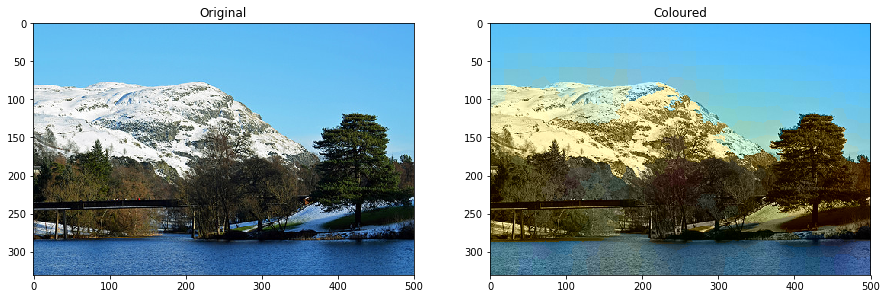

In [105]:
f, ax = plt.subplots(1, 2, figsize=(15,15))
ax[0].imshow(img_original)
ax[0].set_title("Original")
ax[1].imshow(img_predicted)
ax[1].set_title("Coloured")

Сега дърветата имат доста реалистичен цвят(Вече няма лилави дървета). Време е да пробвам и други модели.

In [113]:
from sklearn.neural_network import MLPRegressor


def train_mlp(path, model_name, number_of_segments, sample_size, n_bins, retrain=False):
    if retrain:
        lum_all, u_all, v_all = generate_all_feature_vectors(path, number_of_segments, sample_size, n_bins)
        pca = PCA(n_components=100)
        print("Fitting PCA...")
        pca.fit(lum_all)
        print("Transforming with PCA...")
        lum_all = pca.transform(lum_all)
        u_mlp = MLPRegressor(hidden_layer_sizes=(100, 100, 100), alpha=0.1)
        v_mlp = MLPRegressor(hidden_layer_sizes=(100, 100, 100), alpha=0.1)
        print("Fitting model 1...")
        u_mlp.fit(lum_all, u_all)
        print("Fitting model 2...")
        v_mlp.fit(lum_all, v_all)
        print("Done!")
        joblib.dump(u_mlp, "models/u/{0}_mlp_with_hist_desc_{1}_seg_{2}_sample".format(model_name, number_of_segments, sample_size))
        joblib.dump(v_mlp, "models/v/{0}_mlp_with_hist_desc_{1}_seg_{2}_sample".format(model_name, number_of_segments, sample_size))
        joblib.dump(pca, "models/pca/{0}_pca_with_hist_desc_{1}_seg_{2}_sample".format(model_name, number_of_segments, sample_size))
    else:
        u_mlp = joblib.load("models/u/{0}_mlp_with_hist_desc_{1}_seg_{2}_sample".format(model_name, number_of_segments, sample_size))
        v_mlp = joblib.load("models/v/{0}_mlp_with_hist_desc_{1}_seg_{2}_sample".format(model_name, number_of_segments, sample_size))
        pca = joblib.load("models/pca/{0}_pca_with_hist_desc_{1}_seg_{2}_sample".format(model_name, number_of_segments, sample_size))

    return u_mlp, v_mlp, pca

In [114]:
u_mlp, v_mlp, pca = train_mlp("data/landscapes/train","landscapes", 500, 300, 50, True)

Working on picture 1 of 97

/home/thalvadzhiev/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel/__main__.py:12: ComplexWarning: Casting complex values to real discards the imaginary part


Working on picture 96 of 97
Fitting PCA...
Transforming with PCA...
Fitting model 1...
Fitting model 2...
Done!


In [126]:
img_original, img_predicted = predict_image_smooth("data/landscapes/test/39373580184.jpg",
                                                   u_mlp, v_mlp, pca, 500, 300, 80, 50)

/home/thalvadzhiev/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel/__main__.py:12: ComplexWarning: Casting complex values to real discards the imaginary part


Text(0.5,1,'Coloured')

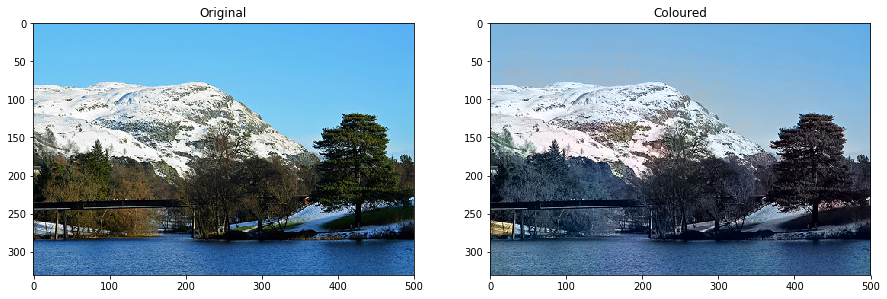

In [127]:
f, ax = plt.subplots(1, 2, figsize=(15,15))
ax[0].imshow(img_original)
ax[0].set_title("Original")
ax[1].imshow(img_predicted)
ax[1].set_title("Coloured")

Невронната мрежа също се справя доста добре, оцветява планината по-реалистично, и водата по-равномерно. За сметка на това има нужда от повече изглаждане на цветовете, съответно дърветата изглеждат по-еднообразно и по бледи.

Време е за grid search. Ще опитам да оптимизирам SVR и невронната мрежа.

In [131]:
lum_all, u_all, v_all = generate_all_feature_vectors("data/landscapes/train", 500, 300, 50)
pca = PCA(n_components=100)
print("Fitting PCA...")
pca.fit(lum_all)
print("Transforming with PCA...")
lum_all = pca.transform(lum_all)

Working on picture 1 of 97

/home/thalvadzhiev/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel/__main__.py:12: ComplexWarning: Casting complex values to real discards the imaginary part


Working on picture 96 of 97
Fitting PCA...
Transforming with PCA...


In [132]:
def grid_search_svr(X, y1, y2):
    cs = [0.06, 0.1, 0.5, 1.1, 1.5 ]
    epsilons = [0.03, 0.06, 0.125, 0.5, 1]
    svrs = []
    for c in cs:
        for eps in epsilons:
            print("now trying C={0}, eps={1}".format(c, eps))
            svr_u = SVR(C=c, epsilon=eps)
            svr_v = SVR(C=c, epsilon=eps)
            svr_u.fit(X, y1)
            svr_v.fit(X, y2)
            svrs.append((c, eps, svr_u, svr_v))
    return svrs

In [133]:
svrs = grid_search_svr(lum_all, u_all, v_all)

now trying C=0.06, eps=0.03
now trying C=0.06, eps=0.06
now trying C=0.06, eps=0.125
now trying C=0.06, eps=0.5
now trying C=0.06, eps=1
now trying C=0.1, eps=0.03
now trying C=0.1, eps=0.06
now trying C=0.1, eps=0.125
now trying C=0.1, eps=0.5
now trying C=0.1, eps=1
now trying C=0.5, eps=0.03
now trying C=0.5, eps=0.06
now trying C=0.5, eps=0.125
now trying C=0.5, eps=0.5
now trying C=0.5, eps=1
now trying C=1.1, eps=0.03
now trying C=1.1, eps=0.06
now trying C=1.1, eps=0.125
now trying C=1.1, eps=0.5
now trying C=1.1, eps=1
now trying C=1.5, eps=0.03
now trying C=1.5, eps=0.06
now trying C=1.5, eps=0.125
now trying C=1.5, eps=0.5
now trying C=1.5, eps=1


In [154]:
from mpl_toolkits.axes_grid1 import ImageGrid

def visualize_svrs(svrs):
    fig = plt.figure(1, (60., 25.))
    grid = ImageGrid(fig, 111, 
                 nrows_ncols=(7, 4),  
                 axes_pad=0.5, 
                 )
    i = 0
    for index, svr_combo in enumerate(svrs):
        c, eps, u_svr, v_svr = svr_combo
        _, img_predicted = predict_image_smooth("data/landscapes/test/39373580184.jpg",
                                                   u_svr, v_svr, pca, 500, 300, 50, 50)
        grid[index].imshow(img_predicted)
        grid[index].set_title("C={0},eps={1}".format(c, eps))
        print("\r{0}".format(i))
        i += 1
        

/home/thalvadzhiev/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel/__main__.py:12: ComplexWarning: Casting complex values to real discards the imaginary part


0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24


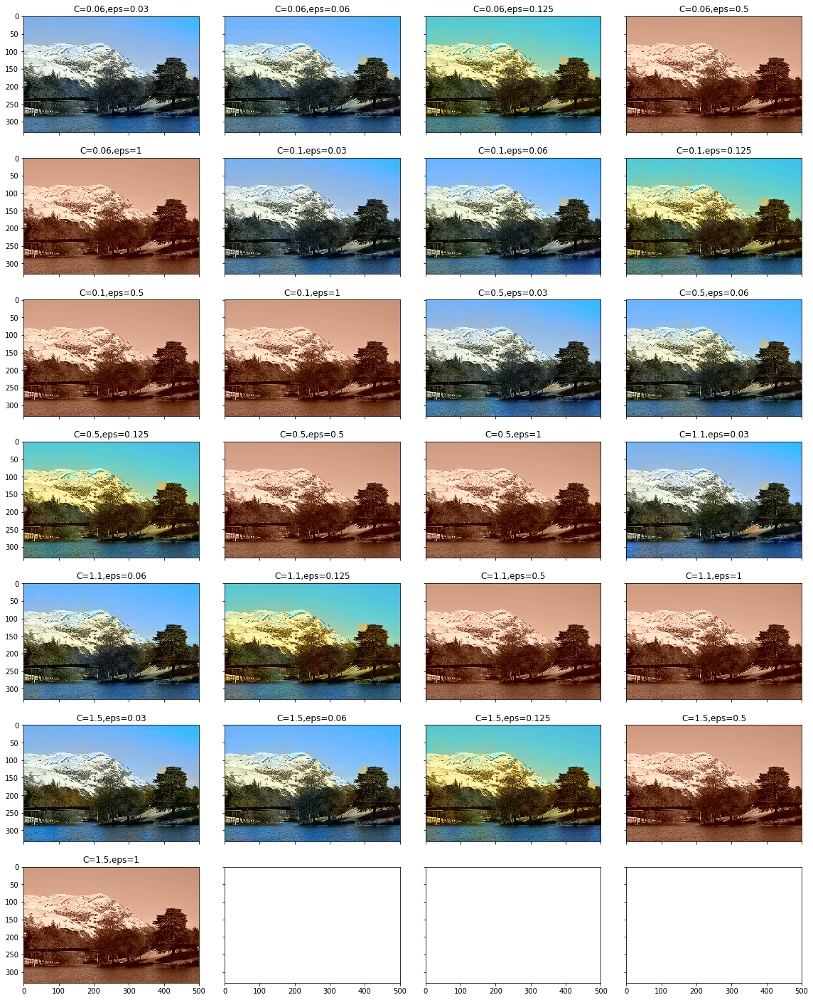

In [155]:
visualize_svrs(svrs)

In [156]:
svr_best_1 , svr_best_2 = svrs[5], svrs[16]

In [157]:
c_1, eps_1, svr_u_1, svr_v_1 = svr_best_1
c_2, eps_2, svr_u_2, svr_v_2 = svr_best_2

In [158]:
_, img_predicted_1 = predict_image_smooth("data/landscapes/test/39373580184.jpg",
                                                   svr_u_1, svr_v_1, pca, 500, 300, 50, 50)
_, img_predicted_2 = predict_image_smooth("data/landscapes/test/39373580184.jpg",
                                                   svr_u_2, svr_v_2, pca, 500, 300, 50, 50)


/home/thalvadzhiev/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel/__main__.py:12: ComplexWarning: Casting complex values to real discards the imaginary part


Text(0.5,1,'C=1.1, eps=0.06')

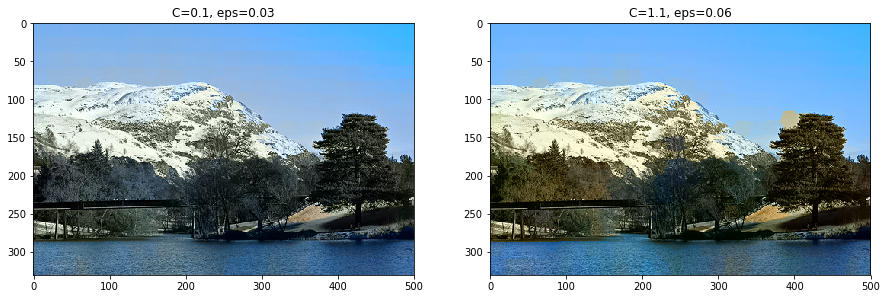

In [159]:
f, ax = plt.subplots(1, 2, figsize=(15,15))
ax[0].imshow(img_predicted_1)
ax[0].set_title("C={0}, eps={1}".format(c_1, eps_1))
ax[1].imshow(img_predicted_2)
ax[1].set_title("C={0}, eps={1}".format(c_2, eps_2))

Изглежда най-добър резултат има при C=0.1, epsilon=0.03. Време е да пробвам и с невронната мрежа.

In [161]:
def grid_search_mlp(X, y1, y2):
    activations = ["logistic", "tanh", "relu"]
    alphas = [0.001, 0.01, 0.1, 0.5, 1]
    mlps = []
    for activation in activations:
        for alpha in alphas:
            print("Now trying activation={0}, alpha={1}".format(activation, alpha))
            u_mlp = MLPRegressor(hidden_layer_sizes=(100, 100, 100), activation=activation, alpha=alpha)
            v_mlp = MLPRegressor(hidden_layer_sizes=(100, 100, 100), activation=activation, alpha=alpha)
            u_mlp.fit(X, y1)
            v_mlp.fit(X, y2)
            mlp_combo = (activation, alpha, u_mlp, v_mlp)
            mlps.append(mlp_combo)
    return mlps

In [162]:
mlps = grid_search_mlp(lum_all, u_all, v_all)

Now trying activation=logistic, alpha=0.001
Now trying activation=logistic, alpha=0.01
Now trying activation=logistic, alpha=0.1
Now trying activation=logistic, alpha=0.5
Now trying activation=logistic, alpha=1
Now trying activation=tanh, alpha=0.001
Now trying activation=tanh, alpha=0.01
Now trying activation=tanh, alpha=0.1
Now trying activation=tanh, alpha=0.5
Now trying activation=tanh, alpha=1
Now trying activation=relu, alpha=0.001
Now trying activation=relu, alpha=0.01
Now trying activation=relu, alpha=0.1
Now trying activation=relu, alpha=0.5
Now trying activation=relu, alpha=1


In [163]:
def visualize_mlps(mlps):
    fig = plt.figure(1, (60., 25.))
    grid = ImageGrid(fig, 111, 
                 nrows_ncols=(5, 3),  
                 axes_pad=0.5, 
                 )
    i = 0
    for index, mlp_combo in enumerate(mlps):
        activation, alpha, u_mlp, v_mlp = mlp_combo
        _, img_predicted = predict_image_smooth("data/landscapes/test/39373580184.jpg",
                                                   u_mlp, v_mlp, pca, 500, 300, 50, 50)
        grid[index].imshow(img_predicted)
        grid[index].set_title("Activation={0},alpha={1}".format(activation, alpha))
        print("\r{0}".format(i))
        i += 1

/home/thalvadzhiev/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel/__main__.py:12: ComplexWarning: Casting complex values to real discards the imaginary part


0
1
2
3
4
5
6
7
8
9
10
11
12
13
14


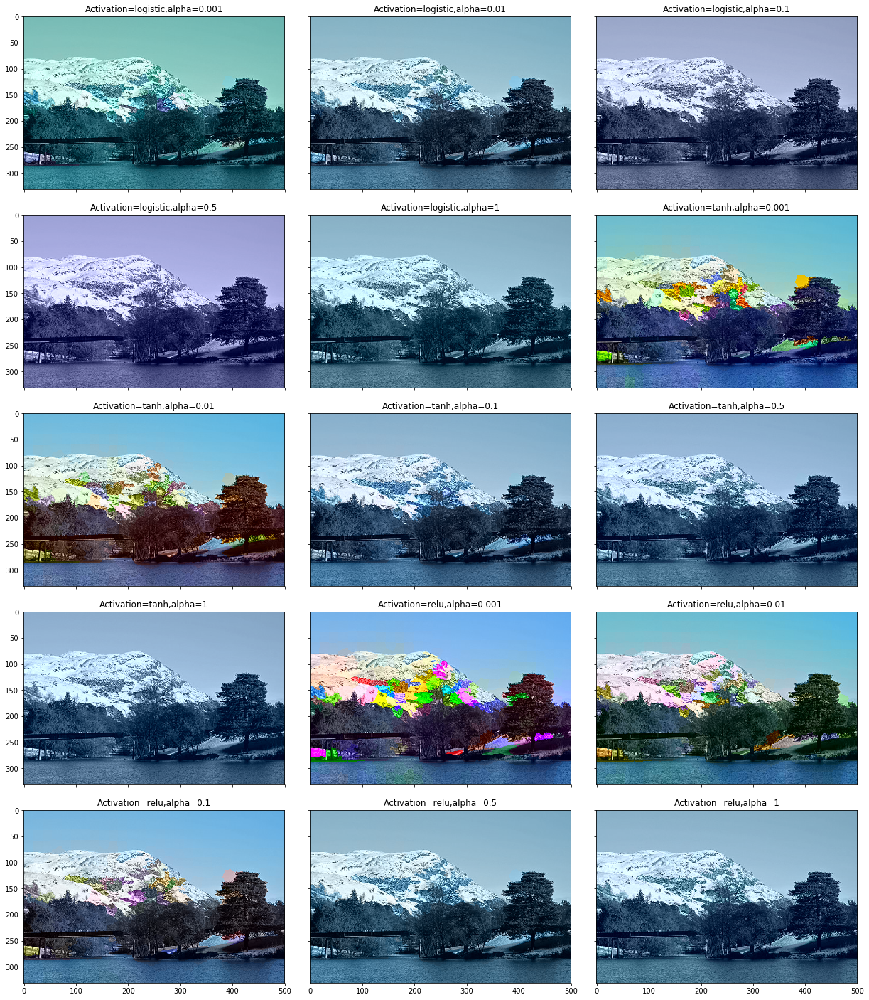

In [164]:
visualize_mlps(mlps)

In [166]:
mlp_best_1, mlp_best_2 = mlps[11], mlps[12]

In [173]:
act_1, alpha_1, mlp_u_1, mlp_v_1 = mlp_best_1
act_2, alpha_2, mlp_u_2, mlp_v_2 = mlp_best_2

In [174]:
_, img_predicted_1_mlp = predict_image_smooth("data/landscapes/test/39373580184.jpg",
                                                   mlp_u_1, mlp_v_1, pca, 500, 300, 80, 50)
_, img_predicted_2_mlp = predict_image_smooth("data/landscapes/test/39373580184.jpg",
                                                   mlp_u_2, mlp_v_2, pca, 500, 300, 80, 50)

/home/thalvadzhiev/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel/__main__.py:12: ComplexWarning: Casting complex values to real discards the imaginary part


Text(0.5,1,'Act=relu, alpha=0.1')

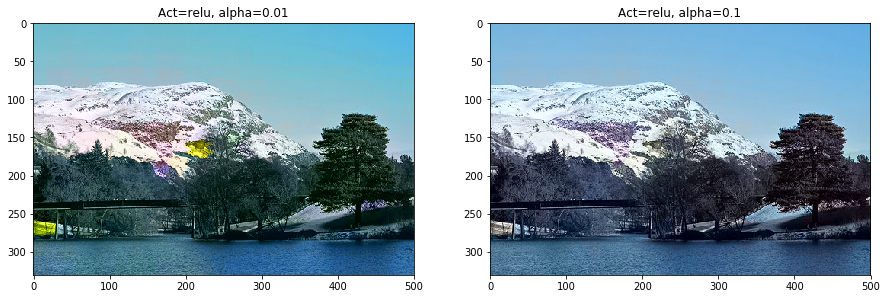

In [175]:
f, ax = plt.subplots(1, 2, figsize=(15,15))
ax[0].imshow(img_predicted_1_mlp)
ax[0].set_title("Act={0}, alpha={1}".format(act_1, alpha_1))
ax[1].imshow(img_predicted_2_mlp)
ax[1].set_title("Act={0}, alpha={1}".format(act_2, alpha_2))

Изглежда най-добрия резултат дава активационната функция relu с алфа 0.01

Да сравним с най-добрия резултат от SVR.

Text(0.5,1,'MLP')

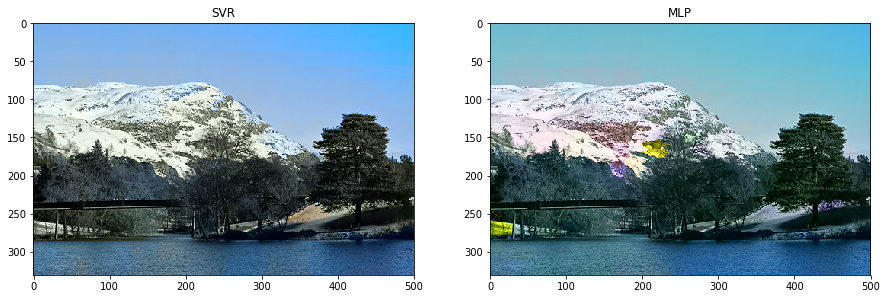

In [176]:
f, ax = plt.subplots(1, 2, figsize=(15,15))
ax[0].imshow(img_predicted_1)
ax[0].set_title("SVR")
ax[1].imshow(img_predicted_1_mlp)
ax[1].set_title("MLP")

Трудно е да се каже кой резултат е по-добър, SVR оцветява планината в по-жълтеникав цвят, но при MLP има жълта аномалия над водата.

Нека видим как се справят с други картинки.

In [177]:
original, img_svr = predict_image_smooth("data/landscapes/test/39373824954.jpg",
                                                   svr_u_1, svr_v_1, pca, 500, 300, 50, 50)
_, img_mlp = predict_image_smooth("data/landscapes/test/39373824954.jpg",
                                                   mlp_u_1, mlp_v_1, pca, 500, 300, 80, 50)

/home/thalvadzhiev/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel/__main__.py:12: ComplexWarning: Casting complex values to real discards the imaginary part


Text(0.5,1,'MLP')

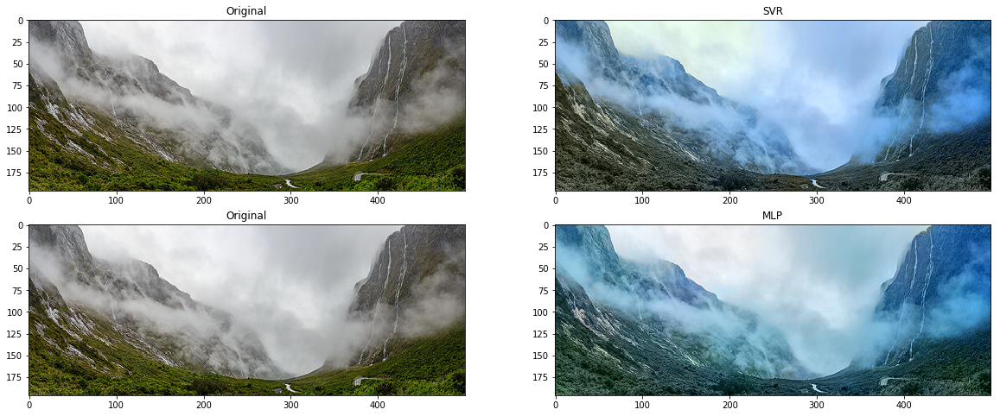

In [182]:
f, ax = plt.subplots(2, 2, figsize=(20, 8))
ax[0, 0].imshow(original)
ax[0, 0].set_title("Original")
ax[0, 1].imshow(img_svr)
ax[0, 1].set_title("SVR")
ax[1, 0].imshow(original)
ax[1, 0].set_title("Original")
ax[1, 1].imshow(img_mlp)
ax[1, 1].set_title("MLP")

Тук изглежда невронната мрежа се справя малко по-добре. Тревата е по зелена.

In [183]:
original_1, img_svr_1 = predict_image_smooth("data/landscapes/test/40084181501.jpg",
                                                   svr_u_1, svr_v_1, pca, 500, 300, 50, 50)
_, img_mlp_1 = predict_image_smooth("data/landscapes/test/40084181501.jpg",
                                                   mlp_u_1, mlp_v_1, pca, 500, 300, 80, 50)

/home/thalvadzhiev/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel/__main__.py:12: ComplexWarning: Casting complex values to real discards the imaginary part


Text(0.5,1,'MLP')

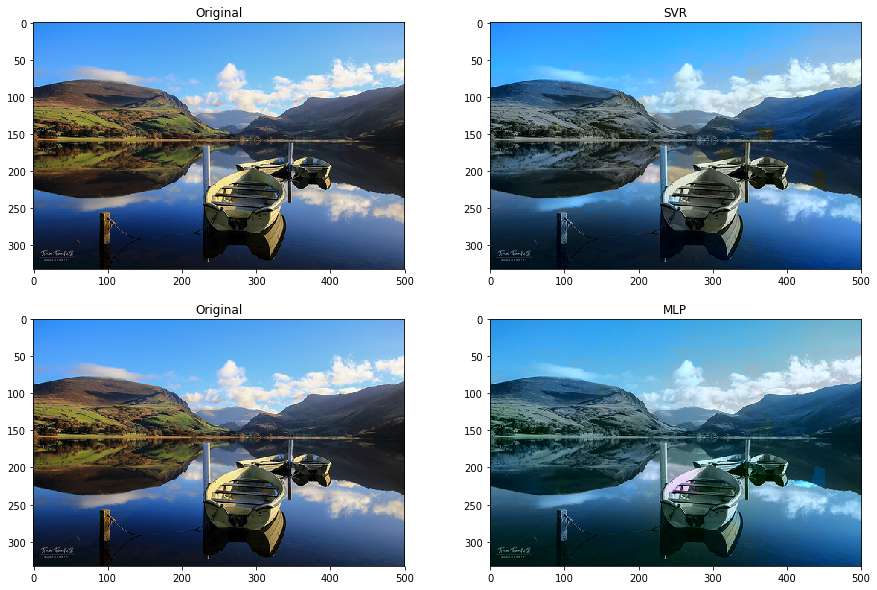

In [188]:
f, ax = plt.subplots(2, 2, figsize=(15, 10))
ax[0, 0].imshow(original_1)
ax[0, 0].set_title("Original")
ax[0, 1].imshow(img_svr_1)
ax[0, 1].set_title("SVR")
ax[1, 0].imshow(original_1)
ax[1, 0].set_title("Original")
ax[1, 1].imshow(img_mlp_1)
ax[1, 1].set_title("MLP")

Тук SVR-a е оцветил по-добре лодката, докато MLP е оцветил по-добре тревата на планината

In [189]:
original_2, img_svr_2 = predict_image_smooth("data/landscapes/test/40082181851.jpg",
                                                   svr_u_1, svr_v_1, pca, 500, 300, 50, 50)
_, img_mlp_2 = predict_image_smooth("data/landscapes/test/40082181851.jpg",
                                                   mlp_u_1, mlp_v_1, pca, 500, 300, 80, 50)

/home/thalvadzhiev/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel/__main__.py:12: ComplexWarning: Casting complex values to real discards the imaginary part


Text(0.5,1,'MLP')

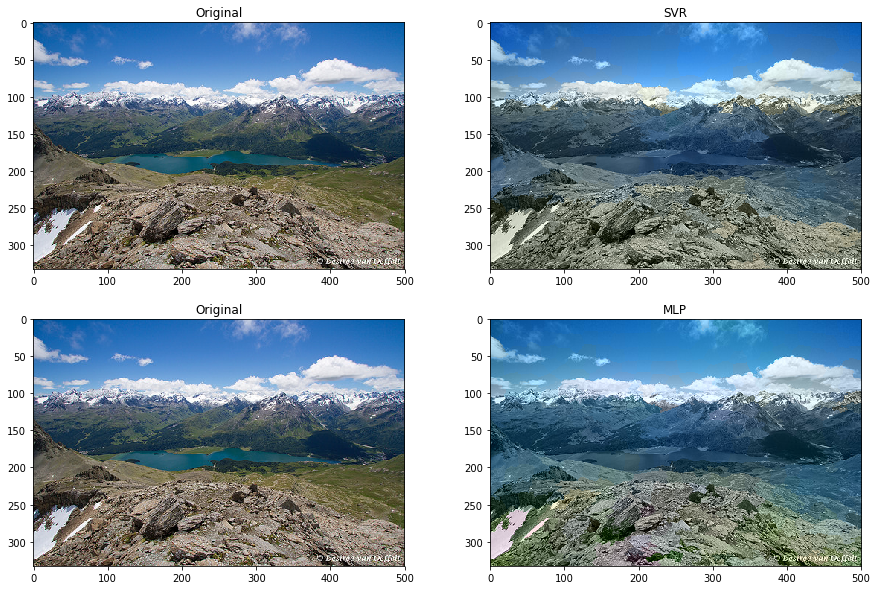

In [190]:
f, ax = plt.subplots(2, 2, figsize=(15, 10))
ax[0, 0].imshow(original_2)
ax[0, 0].set_title("Original")
ax[0, 1].imshow(img_svr_2)
ax[0, 1].set_title("SVR")
ax[1, 0].imshow(original_2)
ax[1, 0].set_title("Original")
ax[1, 1].imshow(img_mlp_2)
ax[1, 1].set_title("MLP")

Най-много се бъркат синия и зеления цвят. В случая и двата модела са оцветили планините в синкаво-зелен цвят.

In [195]:
original_3, img_svr_3 = predict_image_smooth("data/landscapes/test/lake.jpg",
                                                   svr_u_1, svr_v_1, pca, 500, 300, 50, 50)
_, img_mlp_3 = predict_image_smooth("data/landscapes/test/lake.jpg",
                                                   mlp_u_1, mlp_v_1, pca, 500, 300, 80, 50)

/home/thalvadzhiev/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel/__main__.py:12: ComplexWarning: Casting complex values to real discards the imaginary part


Text(0.5,1,'MLP')

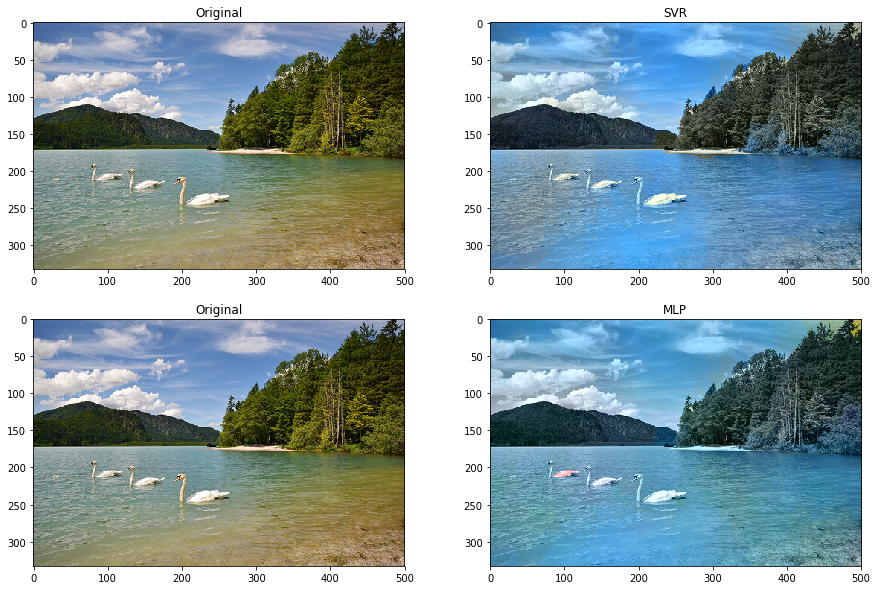

In [196]:
f, ax = plt.subplots(2, 2, figsize=(15, 10))
ax[0, 0].imshow(original_3)
ax[0, 0].set_title("Original")
ax[0, 1].imshow(img_svr_3)
ax[0, 1].set_title("SVR")
ax[1, 0].imshow(original_3)
ax[1, 0].set_title("Original")
ax[1, 1].imshow(img_mlp_3)
ax[1, 1].set_title("MLP")

Плажът е оцветен правилно от SVR-a, небето е добре и при двата модела. Мрежата е оцветила дърветата в по-ярки цветове, но пък лебедите са посинели. Очаквано нюансите на водата не са предадени правилно.

Нека пробваме и с друг dataset. Той съдържа към 150 картинки на градски пейзажи.

In [197]:
u_mlp_city, v_mlp_city, pca_city = train_mlp("data/city/train","cities", 500, 300, 50, True)

Working on picture 1 of 137

/home/thalvadzhiev/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel/__main__.py:12: ComplexWarning: Casting complex values to real discards the imaginary part


Working on picture 136 of 137
Fitting PCA...
Transforming with PCA...
Fitting model 1...
Fitting model 2...
Done!


In [199]:
lum_all_city, u_all_city, v_all_city = generate_all_feature_vectors("data/city/train", 500, 300, 50)
pca_city = PCA(n_components=100)
print("Fitting PCA...")
pca_city.fit(lum_all_city)
print("Transforming with PCA...")
lum_all_city = pca_city.transform(lum_all_city)
u_mlp_city = MLPRegressor(hidden_layer_sizes=(100, 100, 100), alpha=0.01)
v_mlp_city = MLPRegressor(hidden_layer_sizes=(100, 100, 100), alpha=0.01)
print("Fitting model 1...")
u_mlp_city.fit(lum_all_city, u_all_city)
print("Fitting model 2...")
v_mlp_city.fit(lum_all_city, v_all_city)

Working on picture 1 of 137

/home/thalvadzhiev/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel/__main__.py:12: ComplexWarning: Casting complex values to real discards the imaginary part


Working on picture 136 of 137
Fitting PCA...
Transforming with PCA...
Fitting model 1...
Fitting model 2...


MLPRegressor(activation='relu', alpha=0.01, batch_size='auto', beta_1=0.9,
       beta_2=0.999, early_stopping=False, epsilon=1e-08,
       hidden_layer_sizes=(100, 100, 100), learning_rate='constant',
       learning_rate_init=0.001, max_iter=200, momentum=0.9,
       nesterovs_momentum=True, power_t=0.5, random_state=None,
       shuffle=True, solver='adam', tol=0.0001, validation_fraction=0.1,
       verbose=False, warm_start=False)

In [200]:
u_svr_city = SVR(C=0.1, epsilon=0.03)
v_svr_city = SVR(C=0.1, epsilon=0.03)
u_svr_city.fit(lum_all_city, u_all_city)
v_svr_city.fit(lum_all_city, v_all_city)

SVR(C=0.1, cache_size=200, coef0=0.0, degree=3, epsilon=0.03, gamma='auto',
  kernel='rbf', max_iter=-1, shrinking=True, tol=0.001, verbose=False)

In [201]:
original_4, img_svr_4 = predict_image_smooth("data/city/test/14616215762.jpg",
                                                   u_svr_city, v_svr_city, pca_city, 500, 300, 50, 50)
_, img_mlp_4 = predict_image_smooth("data/city/test/14616215762.jpg",
                                                   u_mlp_city, v_mlp_city, pca_city, 500, 300, 80, 50)

/home/thalvadzhiev/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel/__main__.py:12: ComplexWarning: Casting complex values to real discards the imaginary part


Text(0.5,1,'MLP')

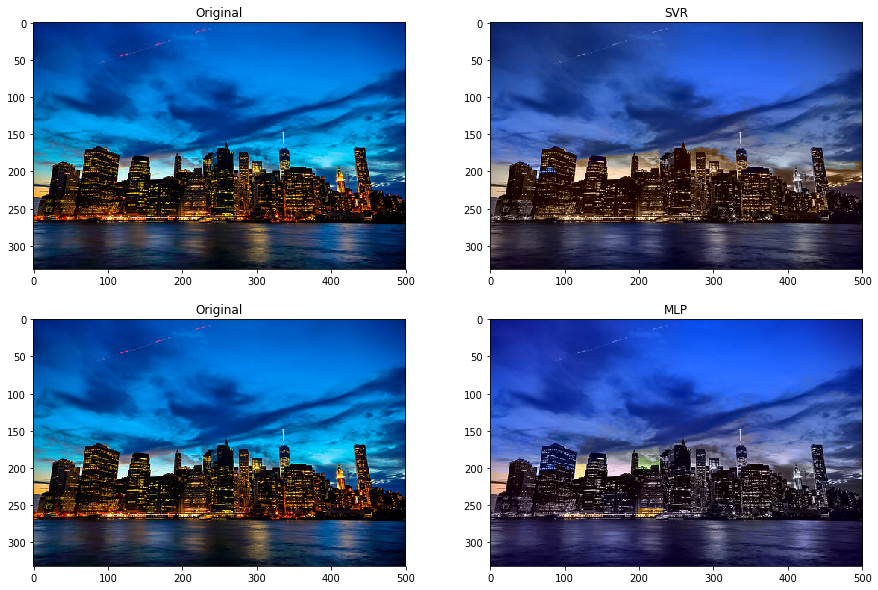

In [202]:
f, ax = plt.subplots(2, 2, figsize=(15, 10))
ax[0, 0].imshow(original_4)
ax[0, 0].set_title("Original")
ax[0, 1].imshow(img_svr_4)
ax[0, 1].set_title("SVR")
ax[1, 0].imshow(original_4)
ax[1, 0].set_title("Original")
ax[1, 1].imshow(img_mlp_4)
ax[1, 1].set_title("MLP")

SVR-a не се справя зле. Сградите имат жълтеникав отенък, но има малко изтичане на цвета към небето.

В заключение този метод оцветява снимките по начин, който е достоверен в повечето случаи. Доста често цветовете са бледи, това може да се дължи на това, че моделите се учат от осреднени стойности на цветовете(в сегмент). Също така моделите са обучавани на сравнително малък брой изображения - 100-150. По-големи и по-разнообразни dataset-ове със сигурност ще подобрят резултатите. 